In [2]:
%load_ext autoreload
%autoreload 2

# Link Analysis
Conducting a link analysis of a network graph involves identifying and analyzing the link within the graph. 

In [3]:
import pandas as pd
import numpy as np
from os.path import join
import os


from dotenv import load_dotenv
load_dotenv()  

path = os.environ['DATA_DIRECTORY']
df_snapshots = pd.read_csv('../data/snapshot_selection.csv')
df_tokens = pd.read_csv("../data/final_token_selection.csv")


In [4]:
import sys
sys.path.append('..') 

from src.analysis.link_analysis import * 
from src.visualisations.link_analysis_visualisations import * 

## Create dataframes for each metrics

In [5]:
# Specify the path to the file containing the saved cliques data
links_data_path = join(path, '../output/links/metrics/links_data_v3.pkl') # load reference value

links_data = LinkData(links_data_path)


# Use the metric_names attribute from CliquesData
metric_names = links_data.metric_names


# Initialize an empty dictionary to store DataFrames for each metric
metric_dataframes = {'sample': {},'sample_population': {},'pvalues': {}, 'sample_directional':{}, 'sample_population_directional':{}, 'pvalues_directional':{}}

# Create DataFrames for each metric
for group in ['sample', 'sample_population', 'pvalues', 'sample_directional', 'sample_population_directional', 'pvalues_directional']:
    for metric_name in metric_names:
        metric_dataframes[group][metric_name] = links_data.get_metric_data(group, metric_name)
        

## Figure Generation

### Fig: Size of Clique 

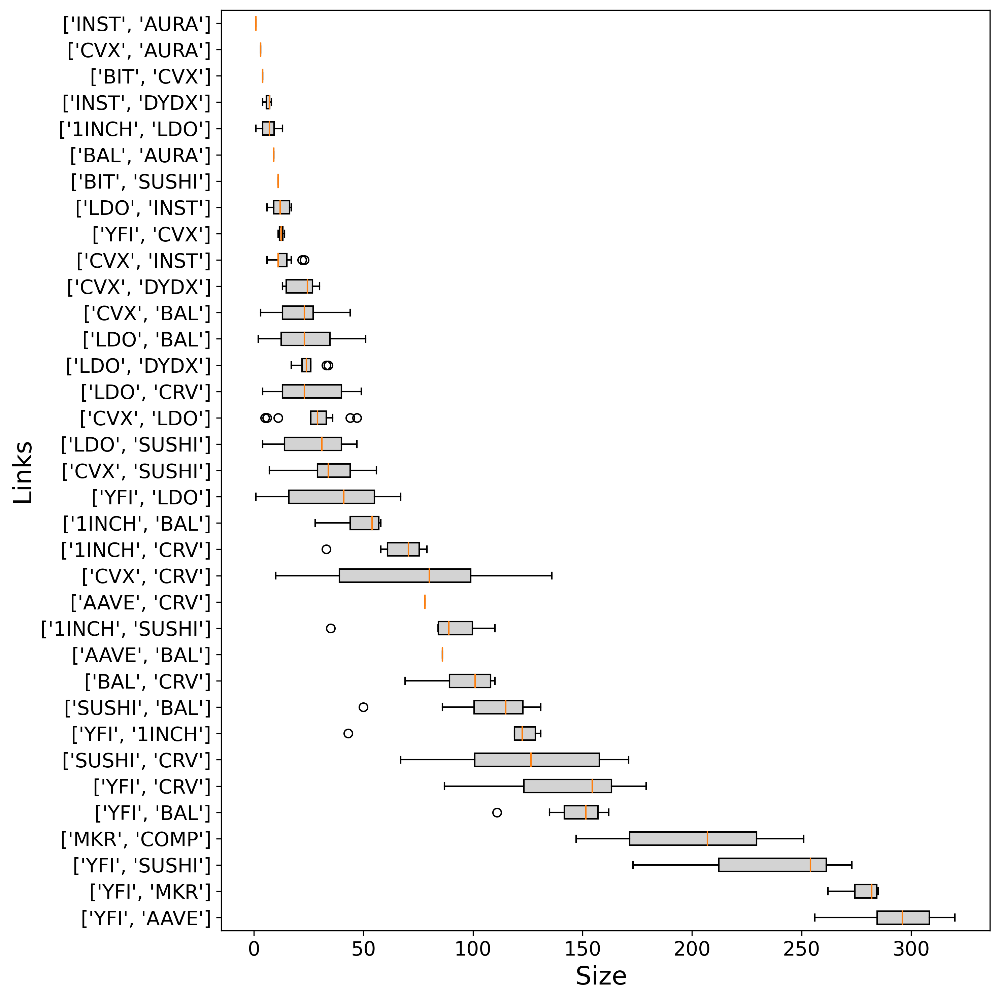

In [6]:
plot_boxplot(metric_dataframes, metric='size', unit='', group='sample', output_path="../output/links/", min_occurrences=1, save=False, show=True)


In [27]:
metric_dataframes['sample']['size'].max().max()

320.0

### Fig: link growth over time 

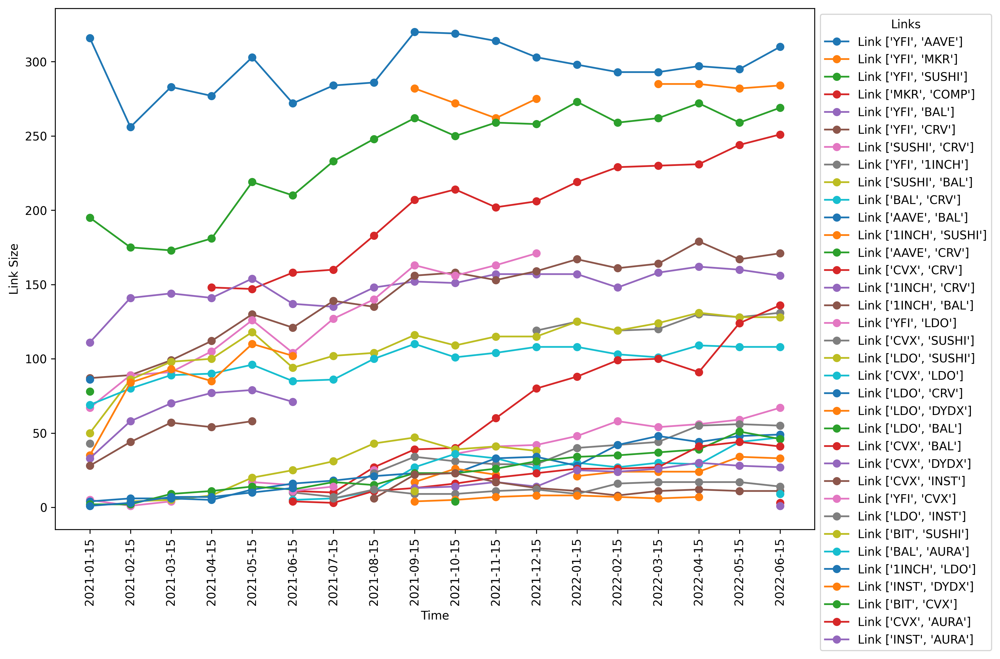

In [7]:
plot_link_growth_over_time(metric_dataframes, group='sample', output_path="../output/links/", save=False, show=True)

### Fig: Scatter  

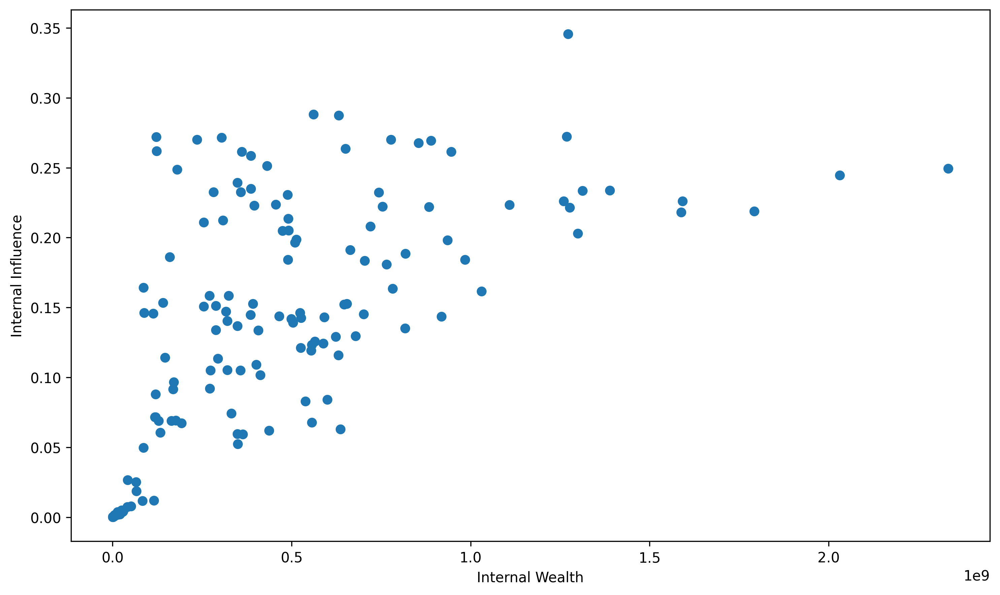

In [8]:
plot_scatter_metrics(metric_dataframes, 'internal_wealth', 'internal_influence', save=False)


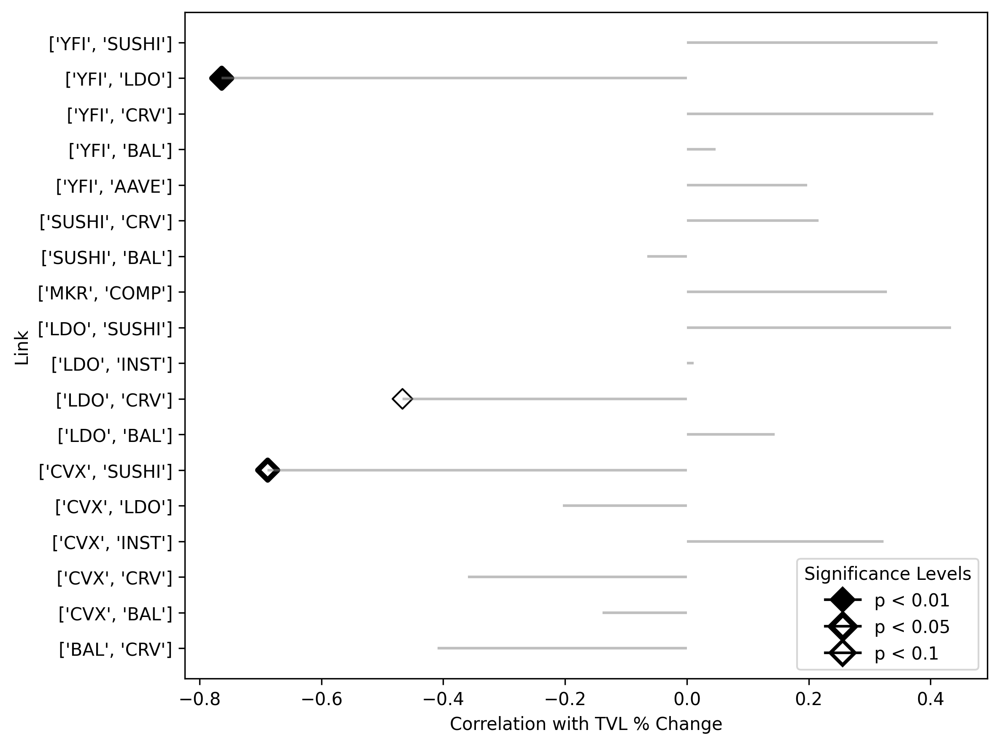

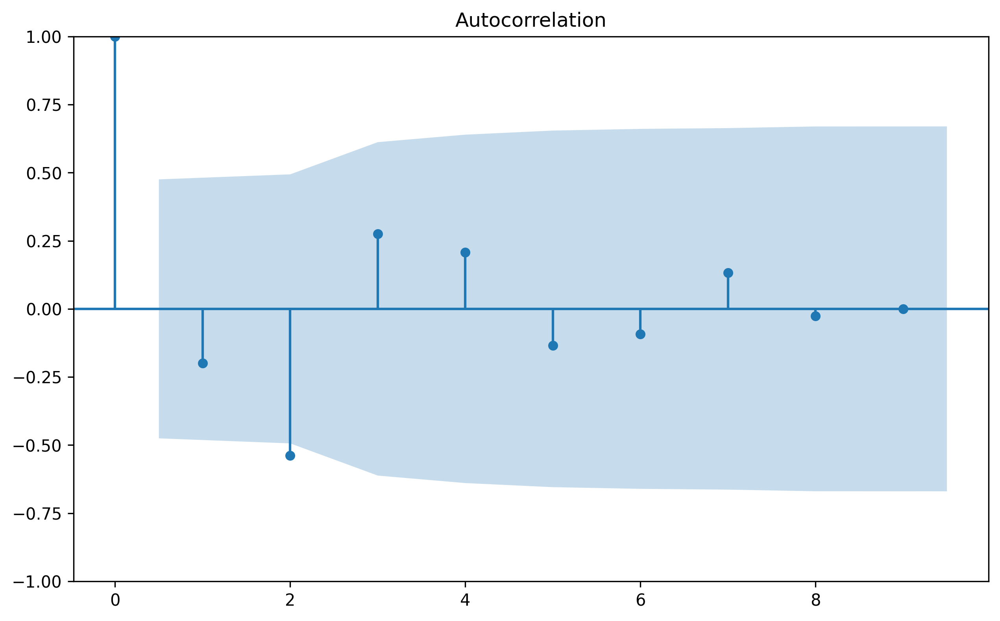


===== Summary Statistics =====
                  Correlation   P-value  Durbin-Watson  Ljung-Box P-value
Link Name                                                                
['BAL', 'CRV']      -0.409517  0.102597       0.738813           0.804060
['CVX', 'BAL']      -0.138663  0.667357       2.185742           0.247922
['CVX', 'CRV']      -0.359588  0.250953       1.297216           0.562715
['CVX', 'INST']      0.322698  0.363127       2.397829           0.561616
['CVX', 'LDO']      -0.203296  0.526266       0.880277           0.670018
['CVX', 'SUSHI']    -0.688164  0.013359       1.018013           0.562746
['LDO', 'BAL']       0.144305  0.580557       2.699140           0.280214
['LDO', 'CRV']      -0.466895  0.058832       1.353841           0.547762
['LDO', 'INST']      0.011288  0.973723       2.089917           0.981410
['LDO', 'SUSHI']     0.433308  0.210953       1.033480           0.626527
['MKR', 'COMP']      0.328573  0.251385       2.195846           0.449375
['SUSH

,Correlation,P-value,Durbin-Watson,Ljung-Box P-value
Link Name,,,,
"['BAL', 'CRV']",-0.409517,0.102597,0.738813,0.804060
"['CVX', 'BAL']",-0.138663,0.667357,2.185742,0.247922
"['CVX', 'CRV']",-0.359588,0.250953,1.297216,0.562715
"['CVX', 'INST']",0.322698,0.363127,2.397829,0.561616
"['CVX', 'LDO']",-0.203296,0.526266,0.880277,0.670018
"['CVX', 'SUSHI']",-0.688164,0.013359,1.018013,0.562746
"['LDO', 'BAL']",0.144305,0.580557,2.699140,0.280214
"['LDO', 'CRV']",-0.466895,0.058832,1.353841,0.547762
"['LDO', 'INST']",0.011288,0.973723,2.089917,0.981410


In [9]:
plot_lollipop_correlation_vs_tvl_adjusted_auto_corr(metric_dataframes, metric='internal_influence', min_occurrences=9, output_path='../output/links', tvl_data_path='../data/tvl.json', save=True, show=True)

### Fig: TVL

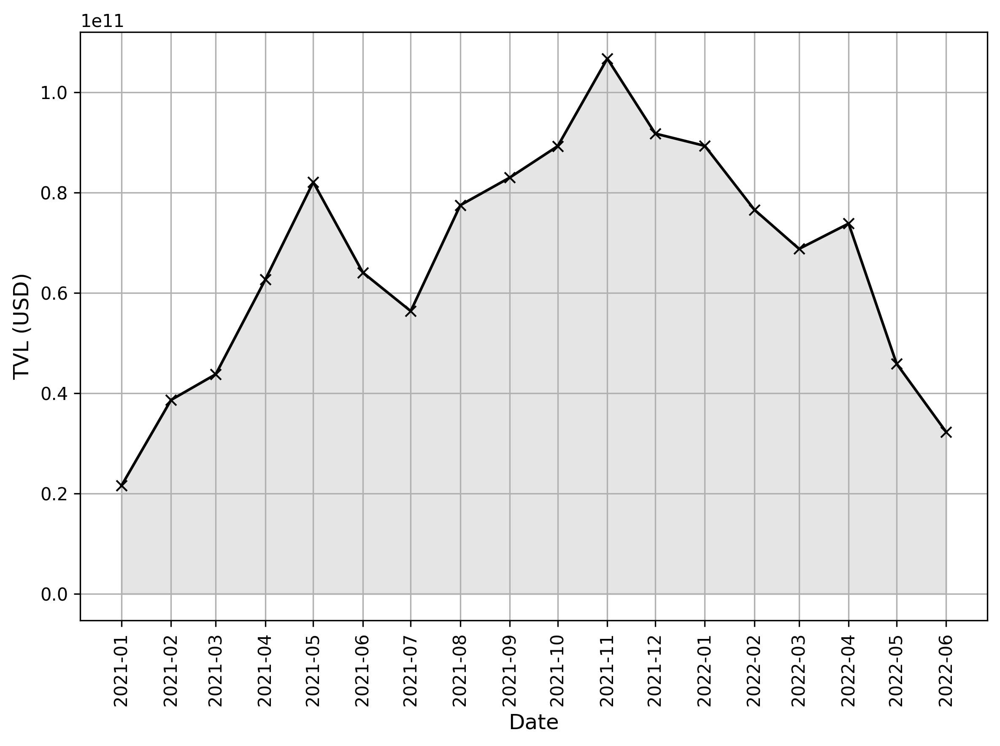

In [10]:
plot_monthly_tvl(metric_dataframes, tvl_data_path='../data/tvl.json', save=True, show=True)


### Fig: Internal Influence

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


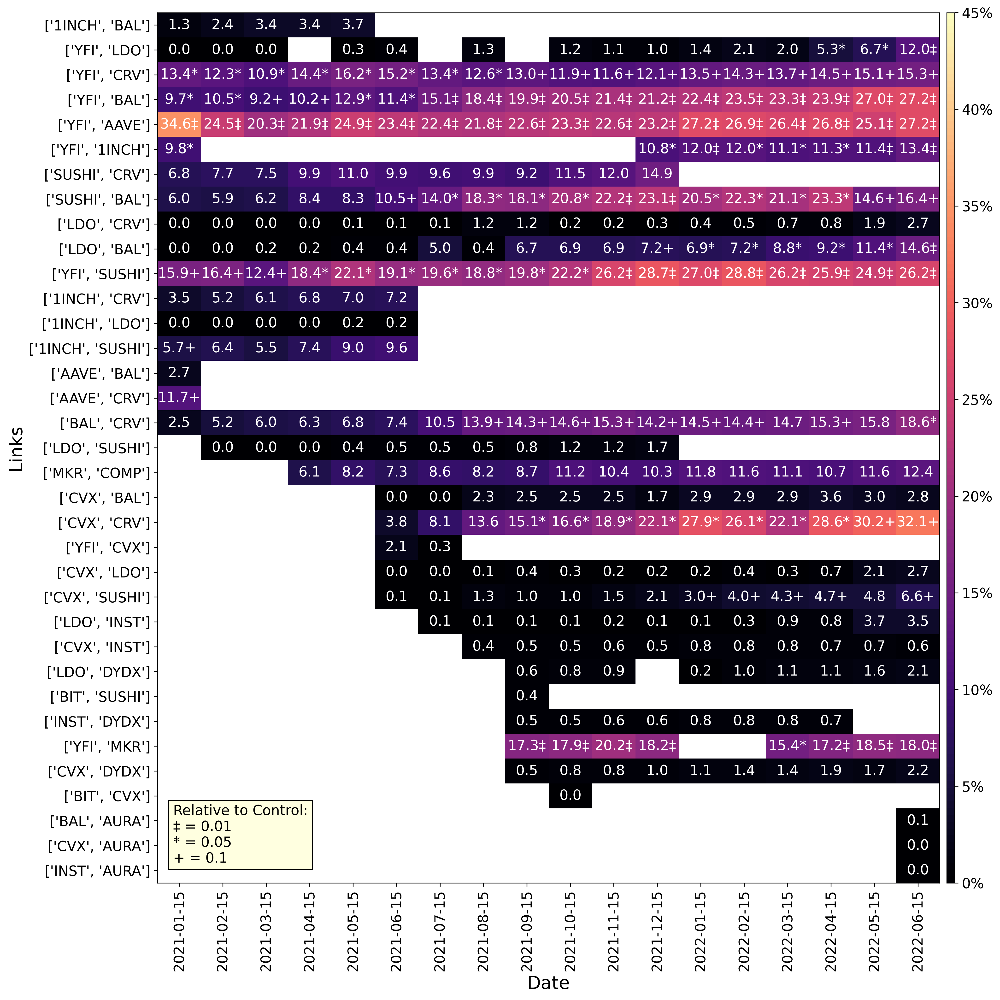

In [18]:
clique_order = plot_heatmap_chart(metric_dataframes, metric_name='internal_influence', pct=True,  log=False, output_path="../output/links/", save=True, show=True)

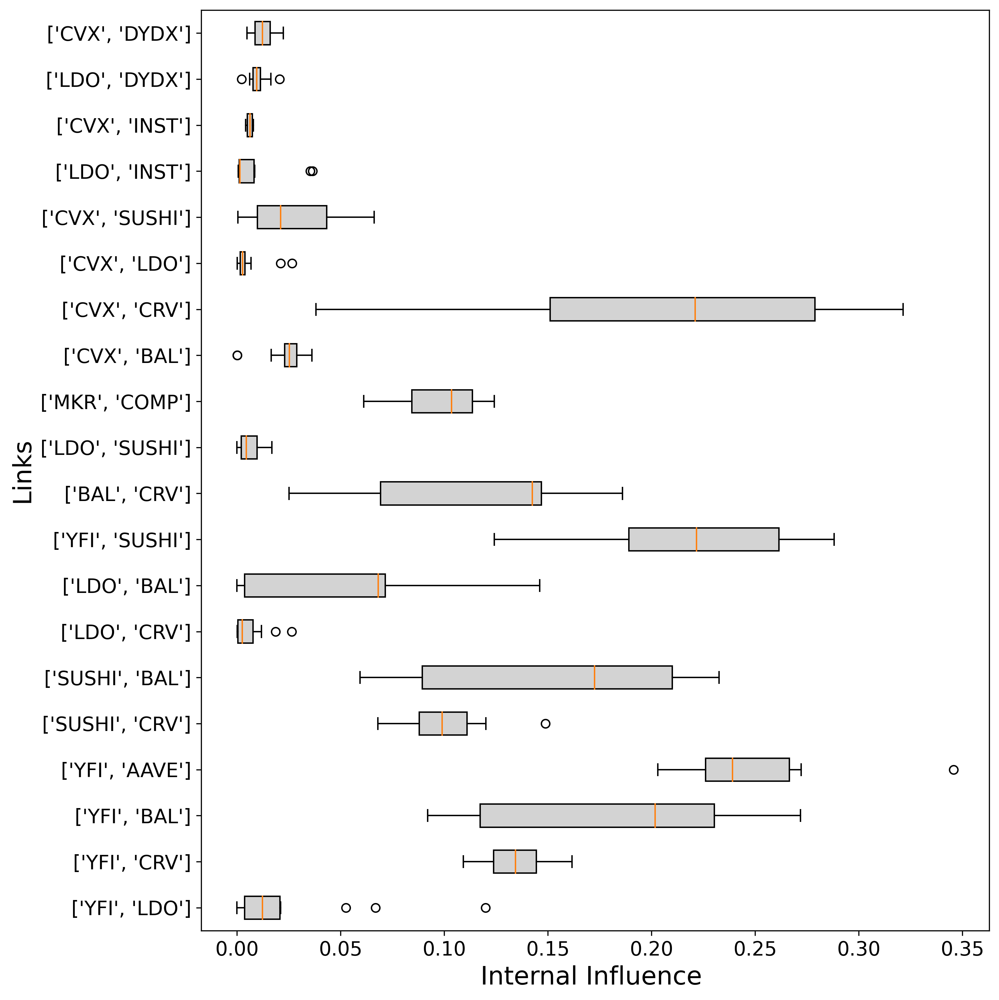

In [41]:
plot_boxplot(metric_dataframes, metric='internal_influence', unit='',group='sample', output_path="../output/links/", min_occurrences=9, custom_index=clique_order, save=True, show=True)

In [34]:
link_order

Index(['['YFI', 'AAVE']', '['YFI', 'SUSHI']', '['CVX', 'CRV']',
       '['YFI', 'BAL']', '['YFI', 'MKR']', '['SUSHI', 'BAL']',
       '['YFI', 'CRV']', '['BAL', 'CRV']', '['AAVE', 'CRV']',
       '['YFI', '1INCH']', '['SUSHI', 'CRV']', '['MKR', 'COMP']',
       '['1INCH', 'SUSHI']', '['1INCH', 'CRV']', '['LDO', 'BAL']',
       '['1INCH', 'BAL']', '['AAVE', 'BAL']', '['CVX', 'SUSHI']',
       '['YFI', 'LDO']', '['CVX', 'BAL']', '['CVX', 'DYDX']', '['YFI', 'CVX']',
       '['LDO', 'DYDX']', '['LDO', 'INST']', '['INST', 'DYDX']',
       '['CVX', 'INST']', '['LDO', 'SUSHI']', '['CVX', 'LDO']',
       '['LDO', 'CRV']', '['BIT', 'SUSHI']', '['BAL', 'AURA']',
       '['1INCH', 'LDO']', '['INST', 'AURA']', '['CVX', 'AURA']',
       '['BIT', 'CVX']'],
      dtype='object', name='Link Name')

### Fig: Gini Internal Influence

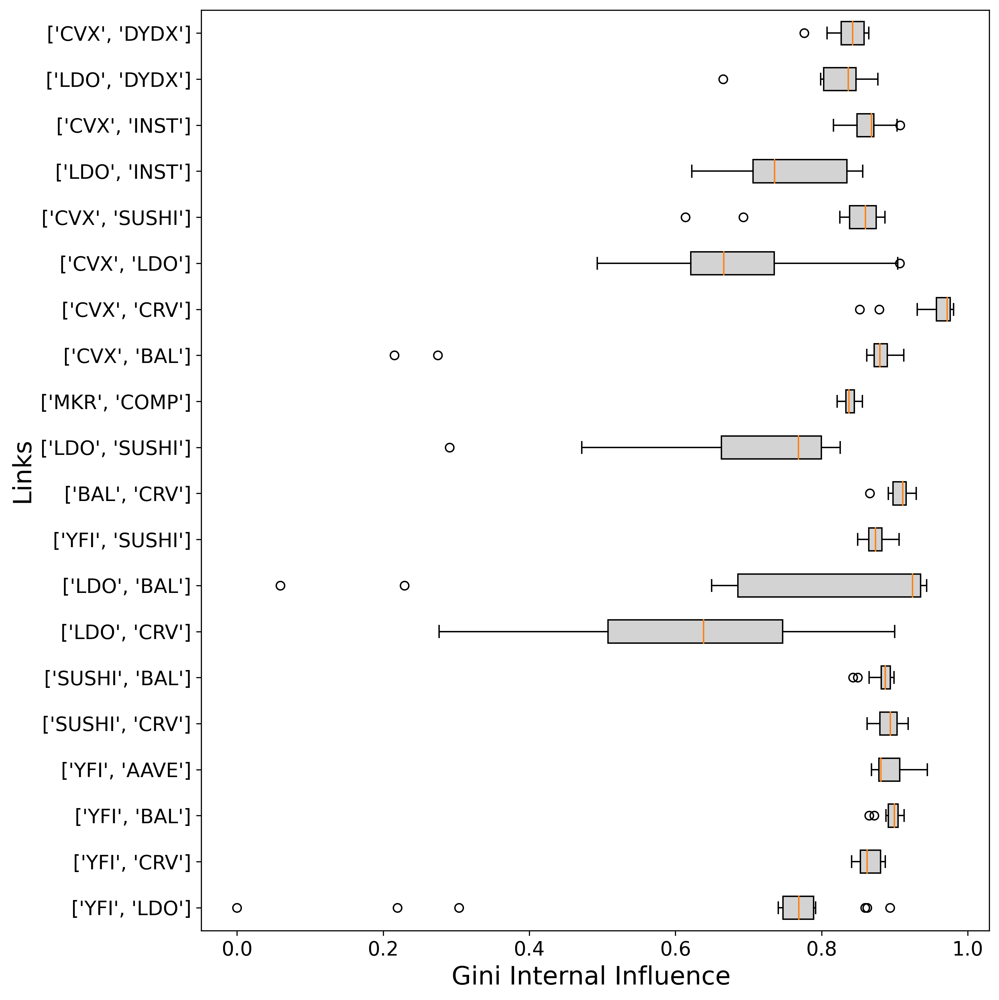

In [42]:
plot_boxplot(metric_dataframes, metric='gini_internal_influence', unit='', group='sample', pval_group='pvalues', output_path="../output/links/", custom_index=clique_order, min_occurrences=9, significance=False, save=True, show=True)

### Fig: external_influence

ValueError: cannot convert float NaN to integer

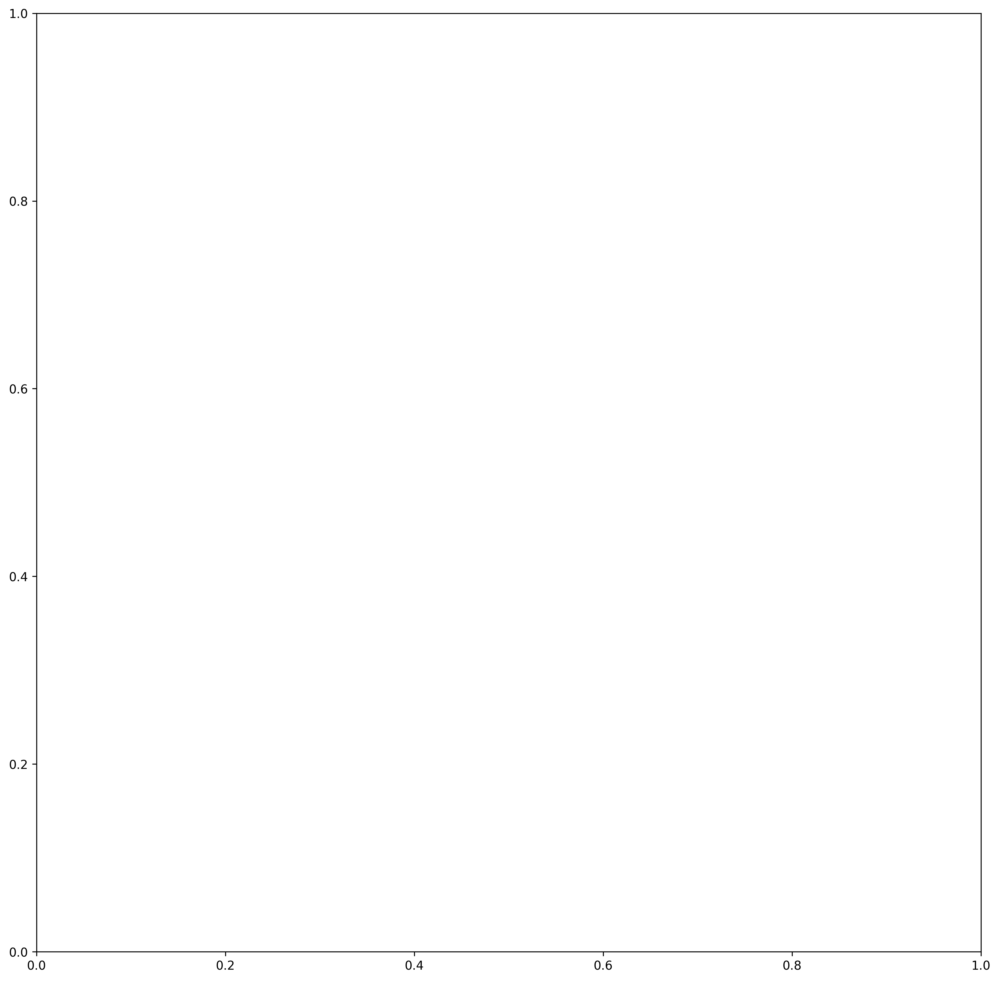

In [14]:
plot_heatmap_chart(metric_dataframes, metric_name='external_influence', pct=True, log=False, output_path="../output/links/", save=True, show=True)

### Fig: gini_external_influence

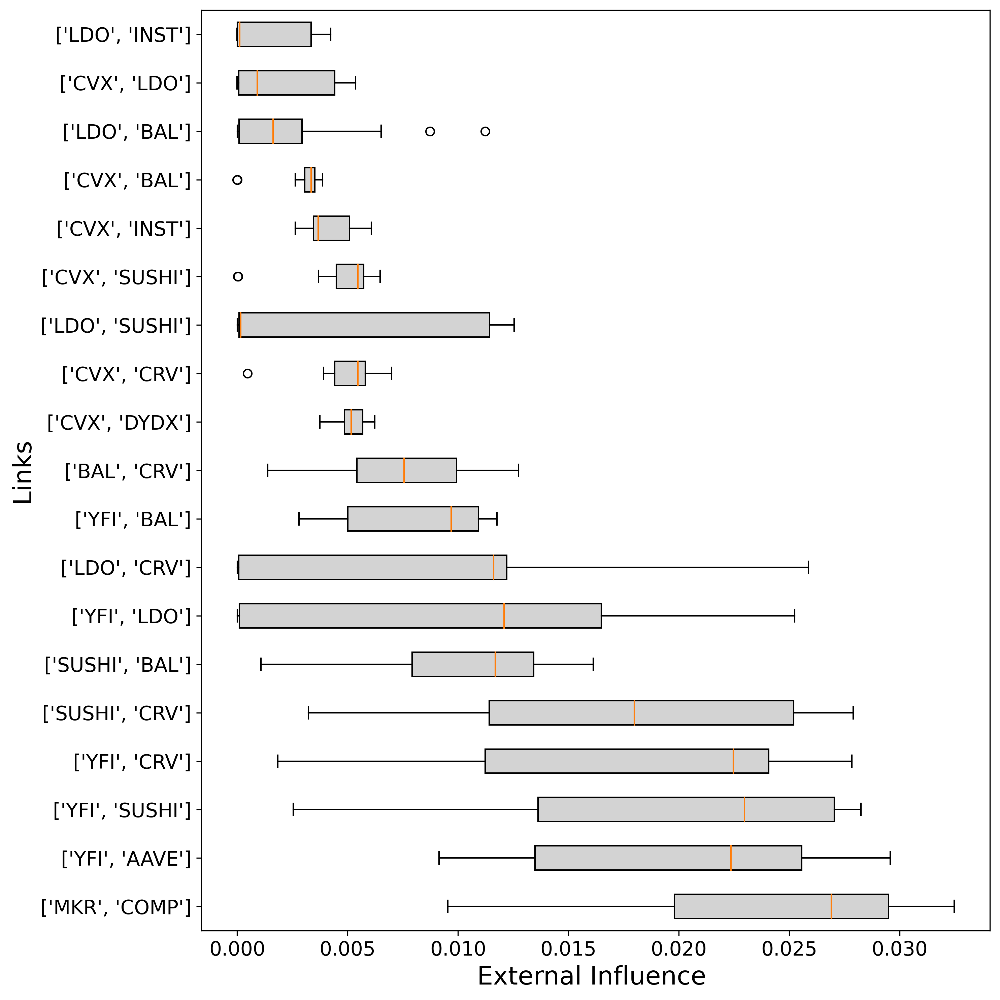

In [ ]:
plot_boxplot(metric_dataframes, metric='external_influence', unit='', group='sample', output_path="../output/links/", save=True, show=True)

### Fig: Wealth 


/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


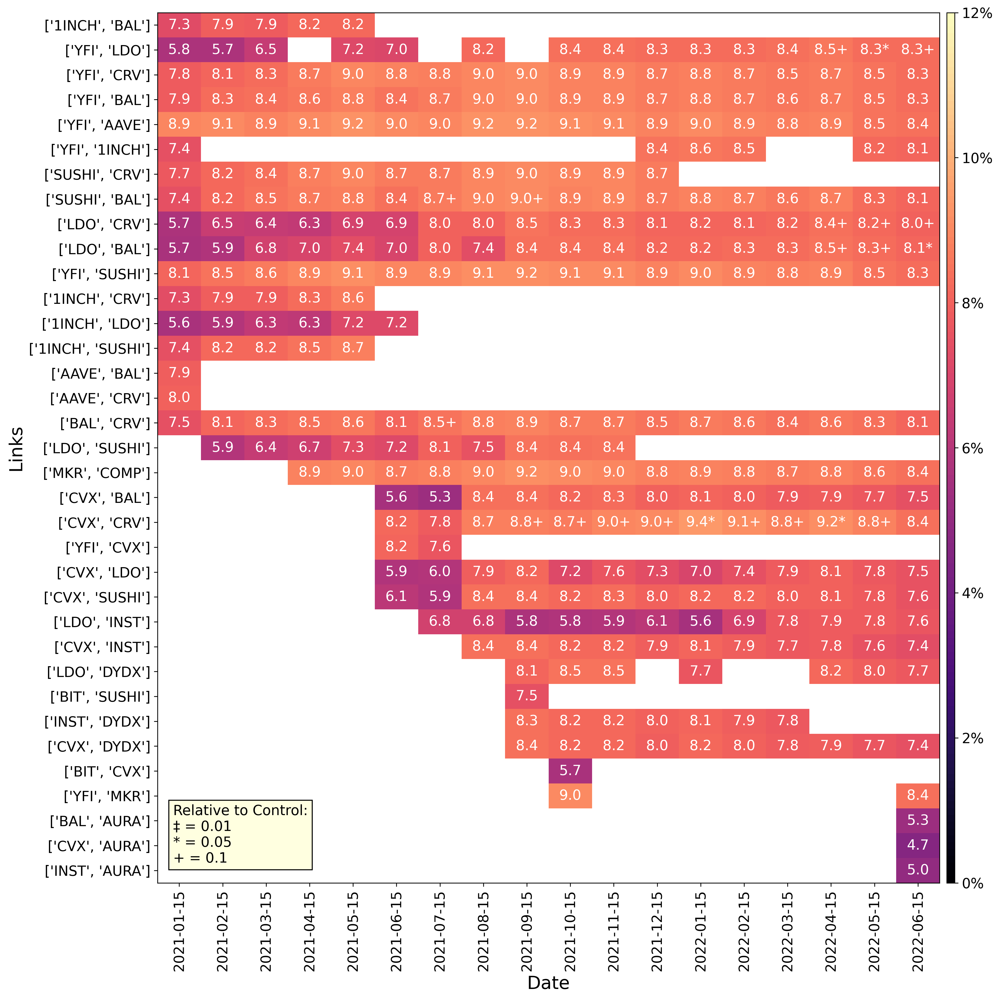

In [ ]:
plot_heatmap_chart(metric_dataframes, metric_name='total_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

### Fig: gini_wealth_clique

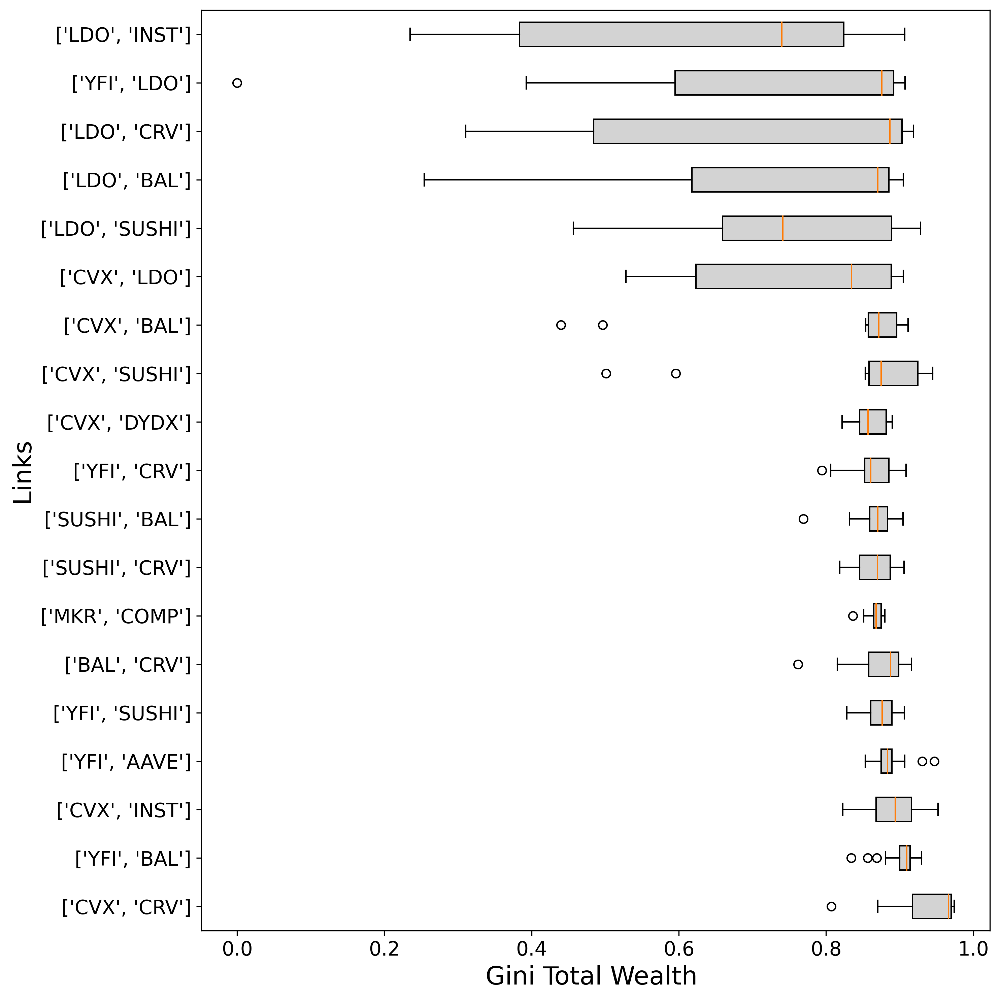

In [ ]:

plot_boxplot(metric_dataframes, metric='gini_total_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: median_wealth_level

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


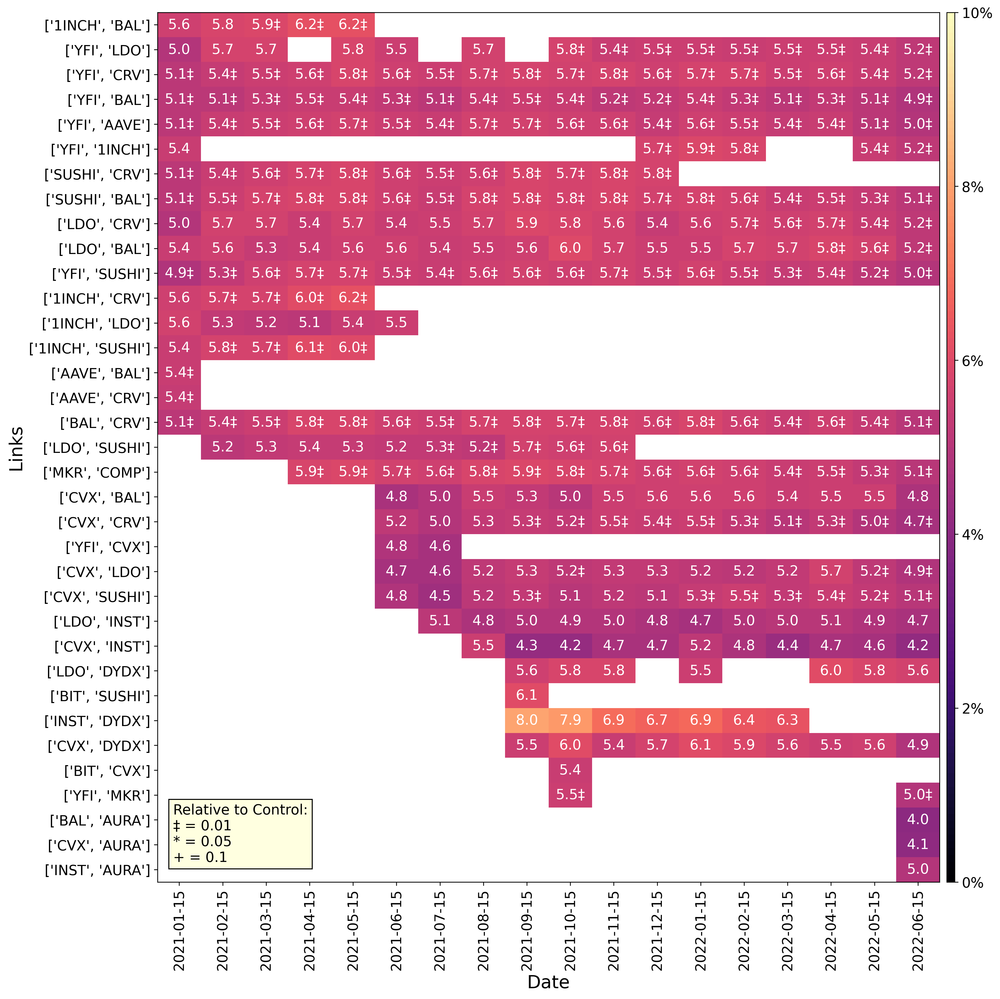

In [ ]:
plot_heatmap_chart(metric_dataframes, metric_name='median_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

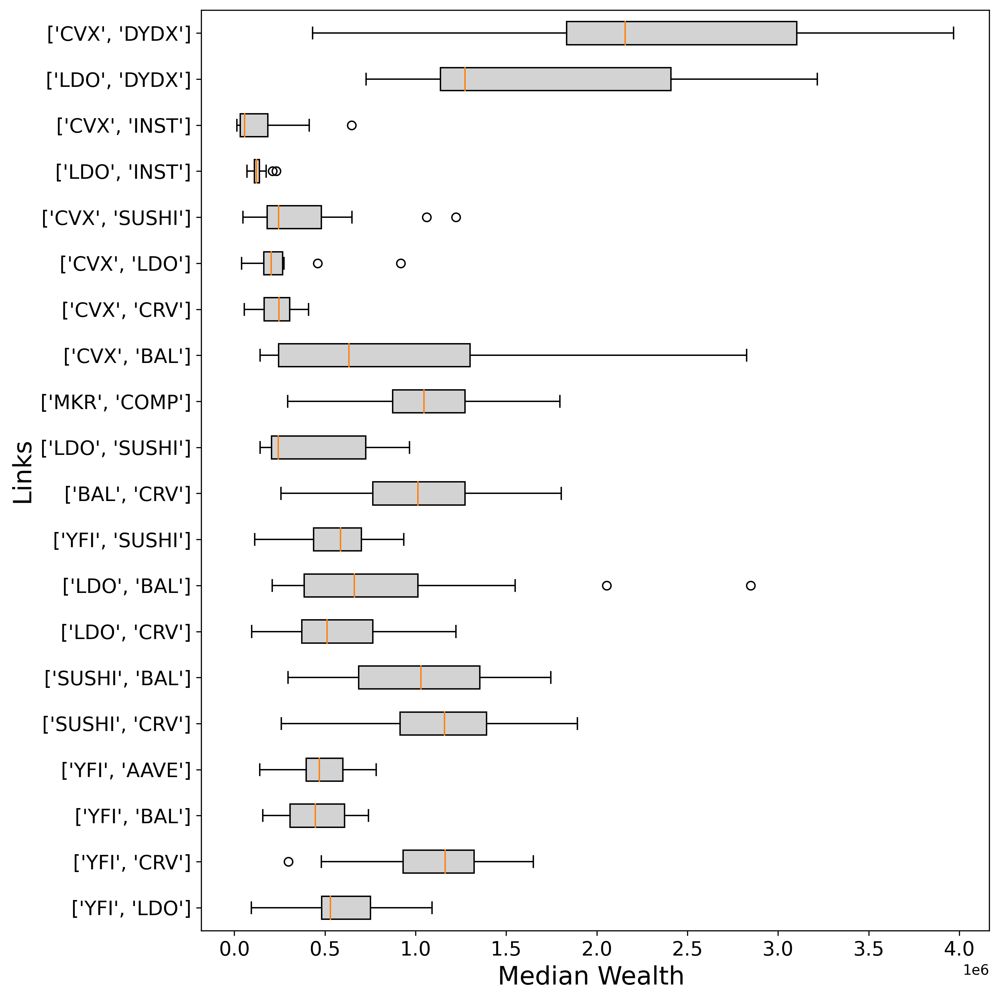

In [43]:
plot_boxplot(metric_dataframes, metric='median_wealth', unit='', group='sample',custom_index=clique_order, output_path="../output/links/", min_occurrences=9, save=True, show=True)


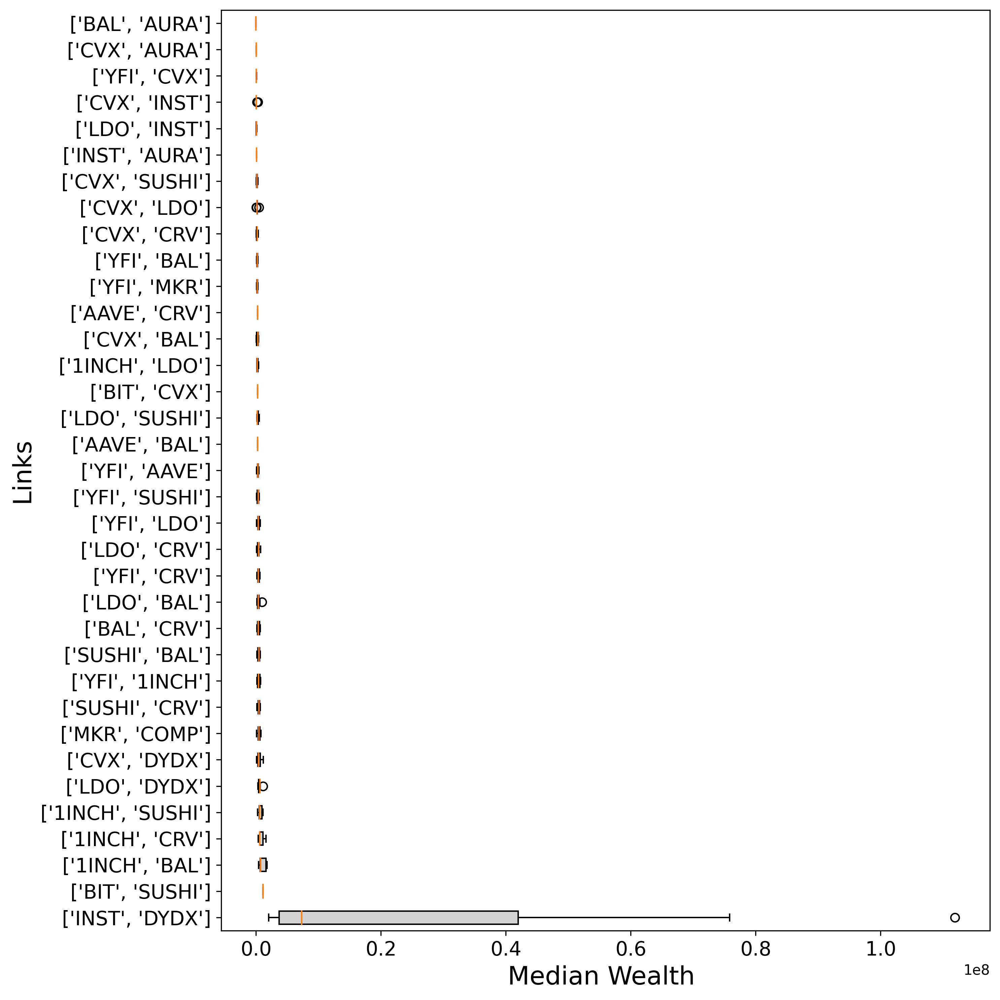

In [ ]:
plot_boxplot(metric_dataframes, metric='median_wealth', unit='', group='sample', output_path="../output/links/", min_occurrences=1, save=False, show=True)


### Fig: internal_wealth

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


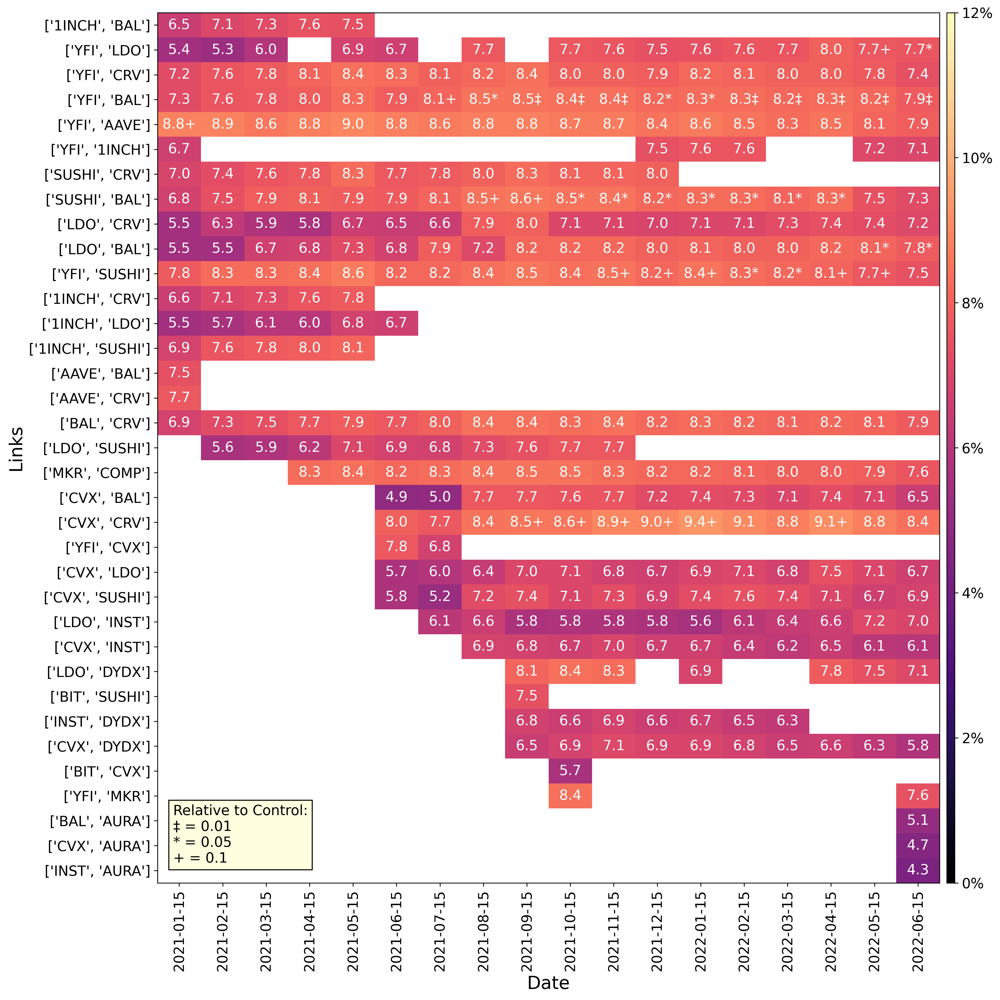

In [ ]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_wealth', pct=False, log=True, output_path="../output/links/", save=False, show=True)

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


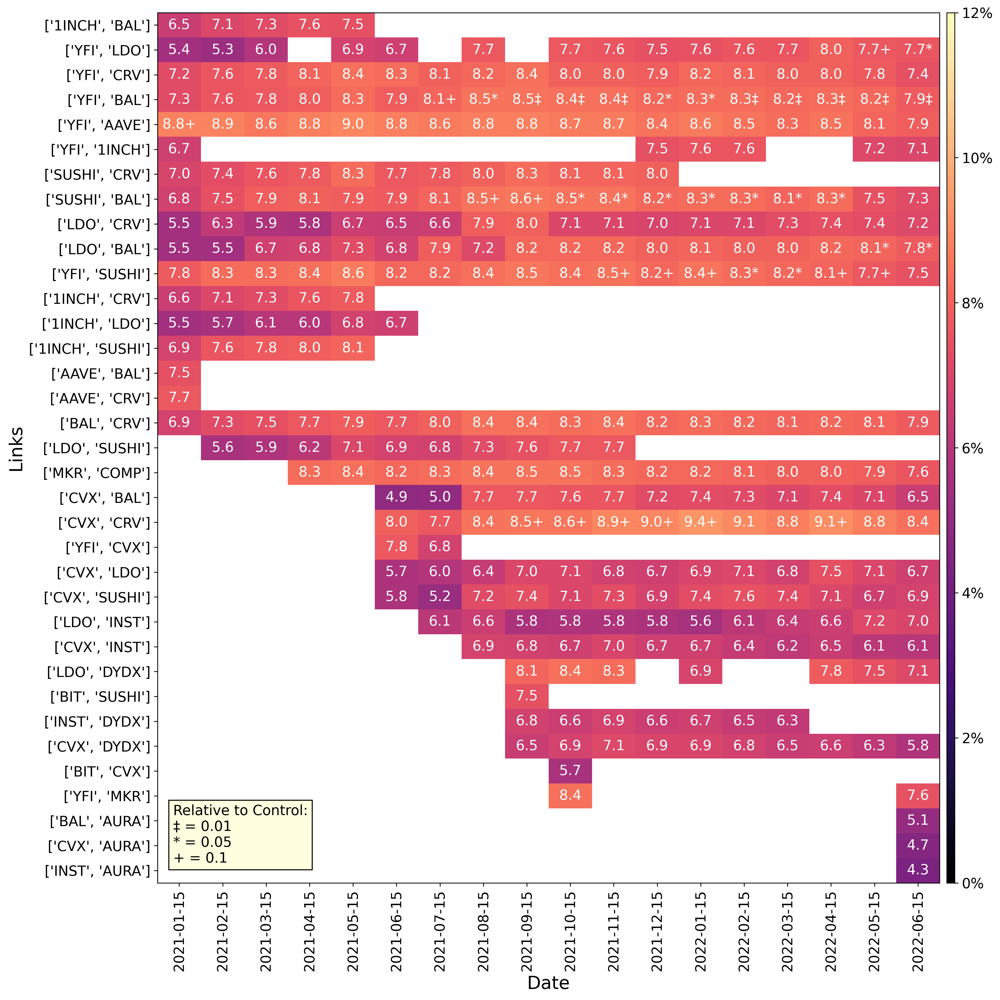

In [ ]:
plot_heatmap_chart(metric_dataframes, metric_name='internal_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

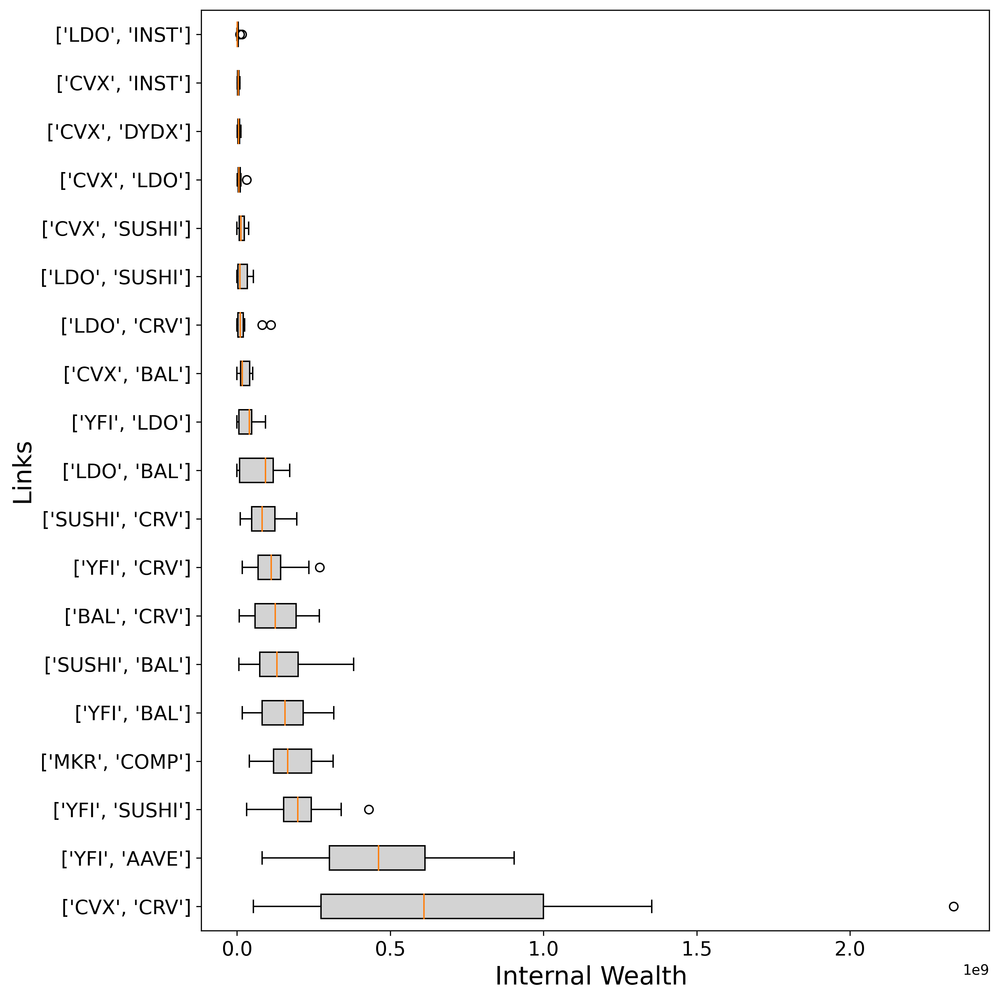

In [ ]:

plot_boxplot(metric_dataframes, metric='internal_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


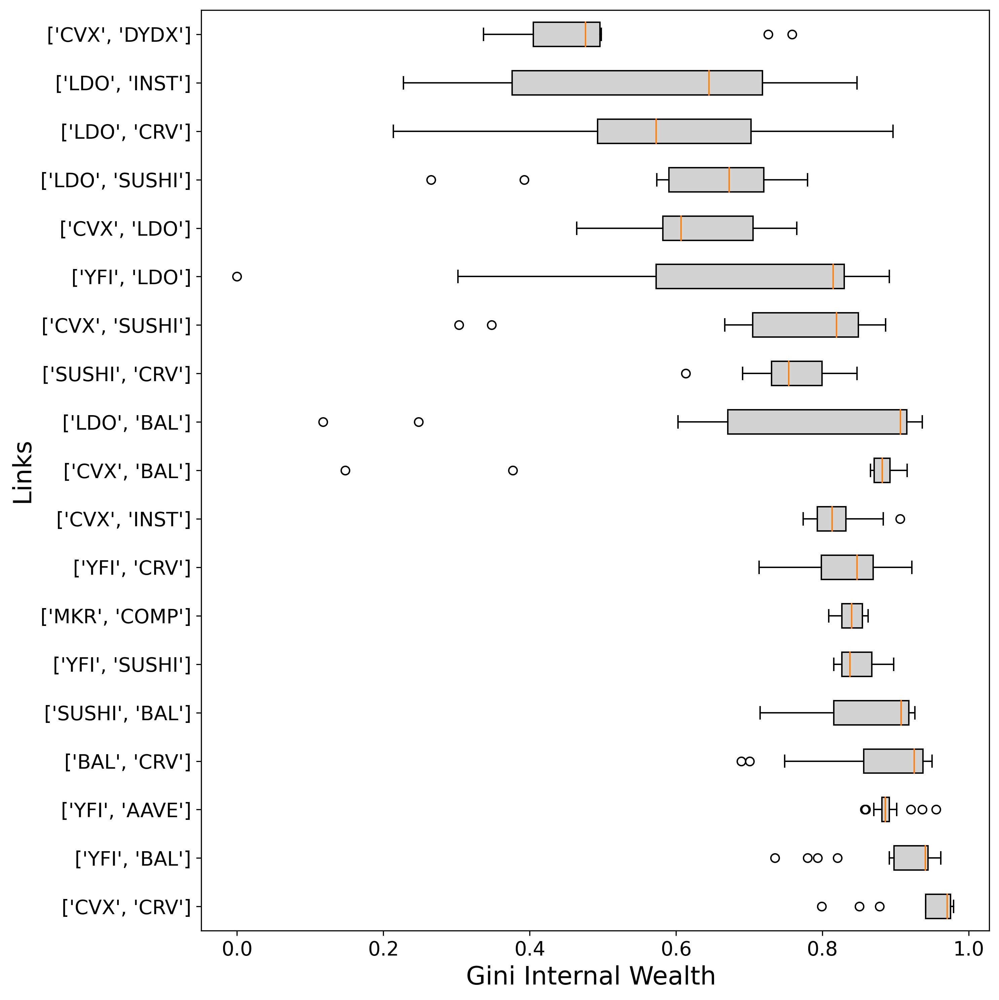

In [ ]:
plot_boxplot(metric_dataframes, metric='gini_internal_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: external_wealth

/home/xm3van/research-project-erc20-governance/.venv/lib/python3.8/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


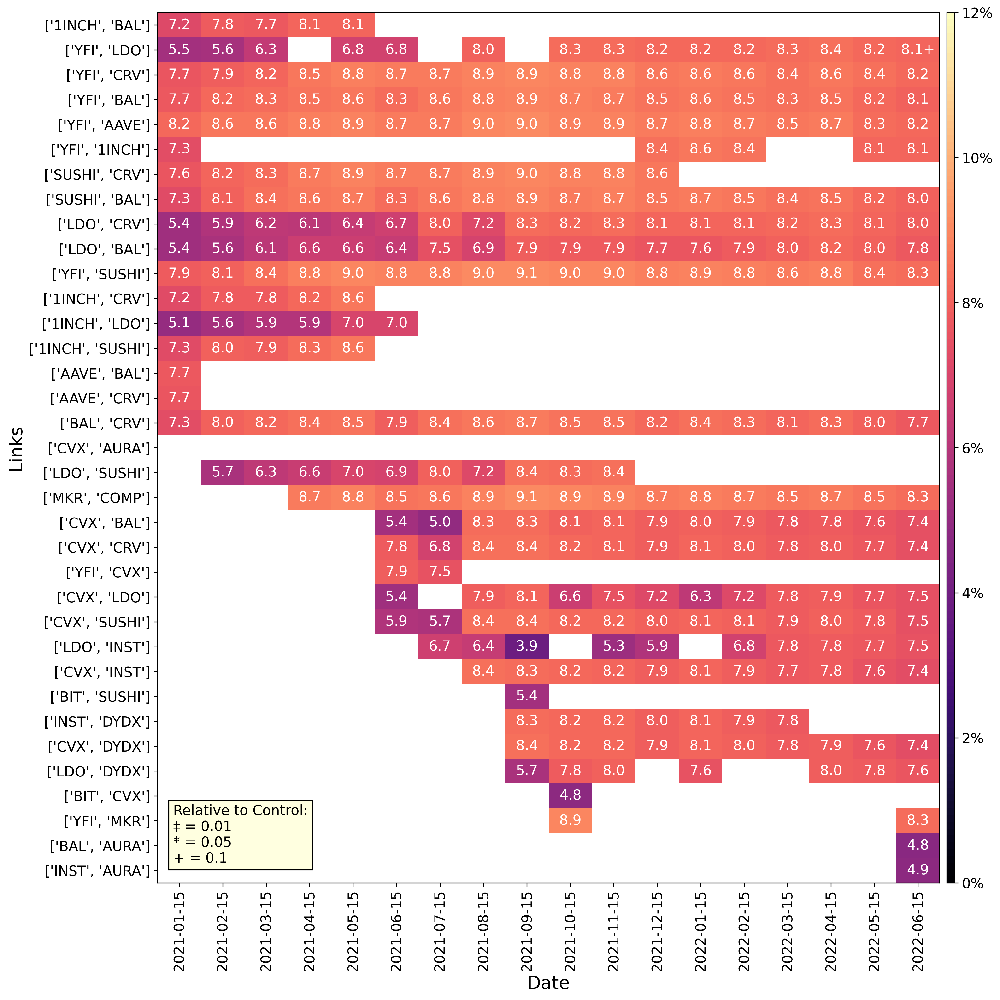

In [ ]:
plot_heatmap_chart(metric_dataframes, metric_name='external_wealth', pct=False, log=True, output_path="../output/links/", save=True, show=True)

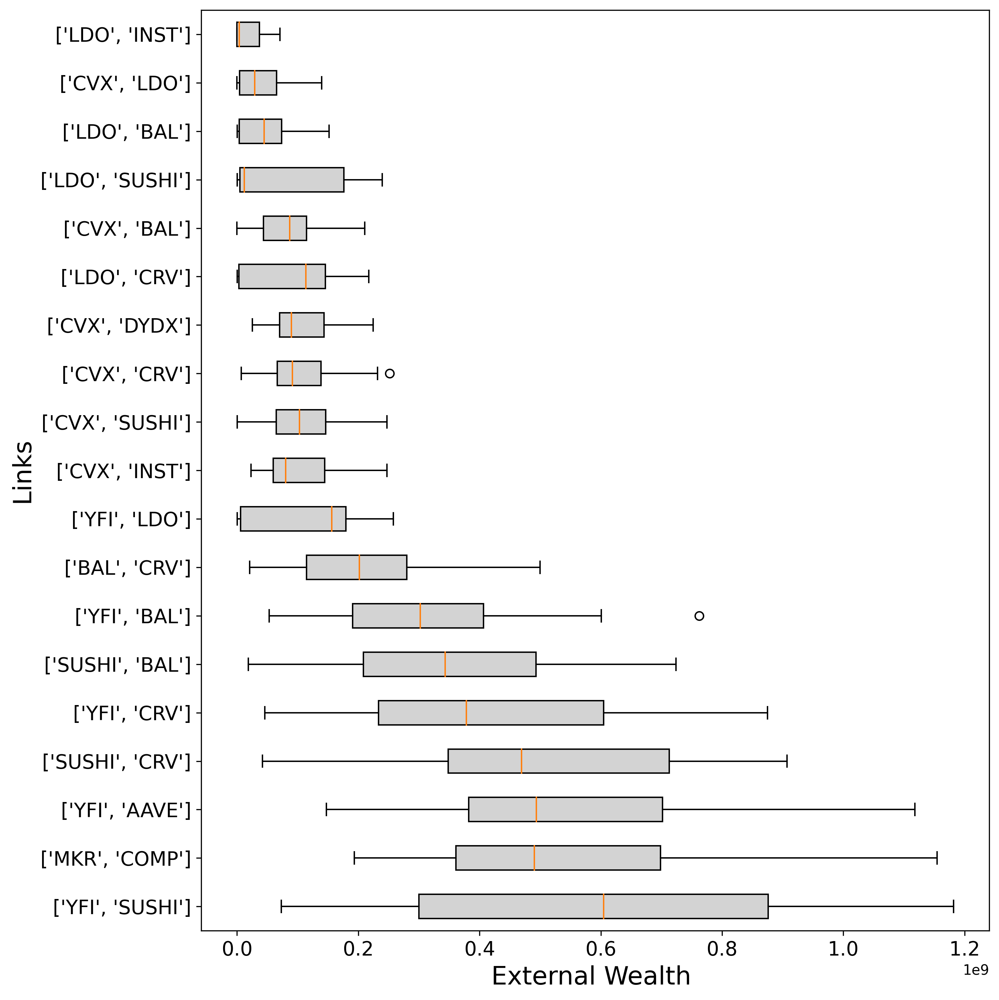

In [ ]:
plot_boxplot(metric_dataframes, metric='external_wealth', unit='', group='sample', output_path="../output/links/", save=False, show=True)


### Fig: gini_external_wealth

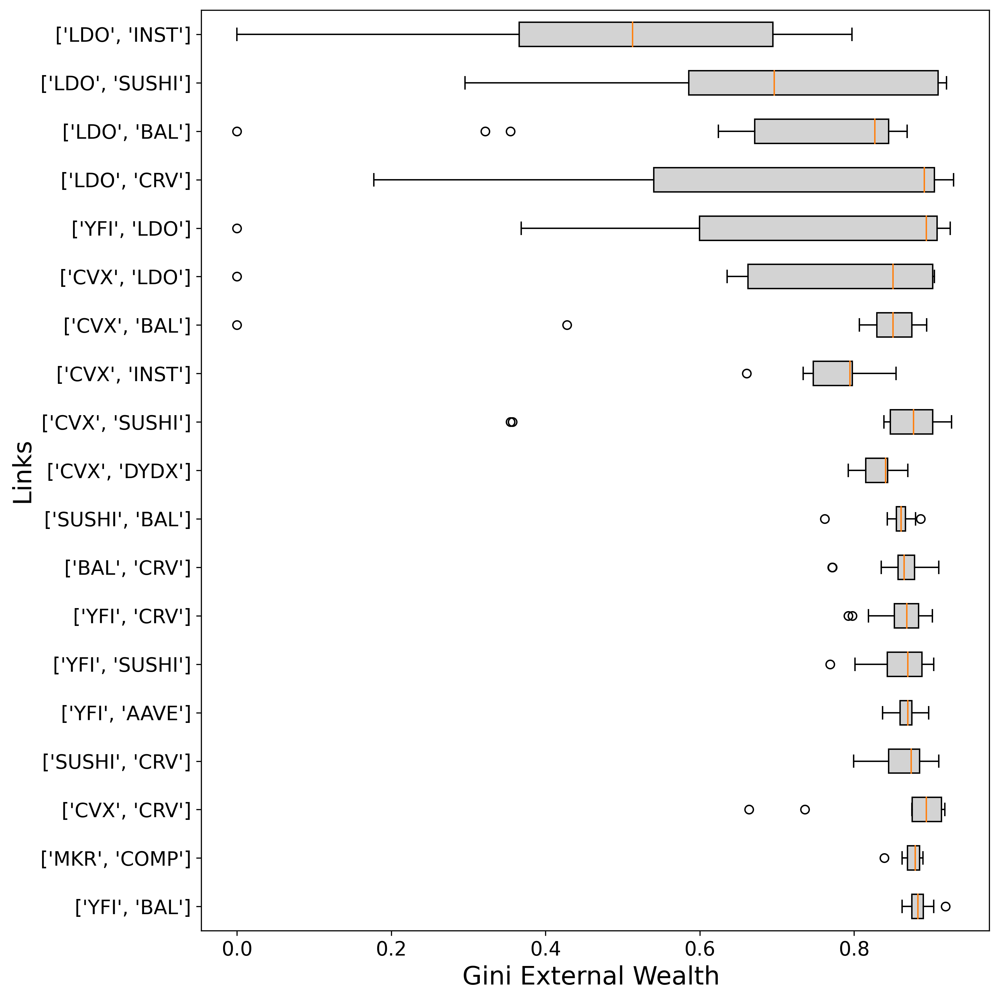

In [ ]:
plot_boxplot(metric_dataframes, metric='gini_external_wealth', unit='', group='sample', output_path="../output/links/", save=True, show=True)


### Fig: median_no_assets_link


/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:287: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


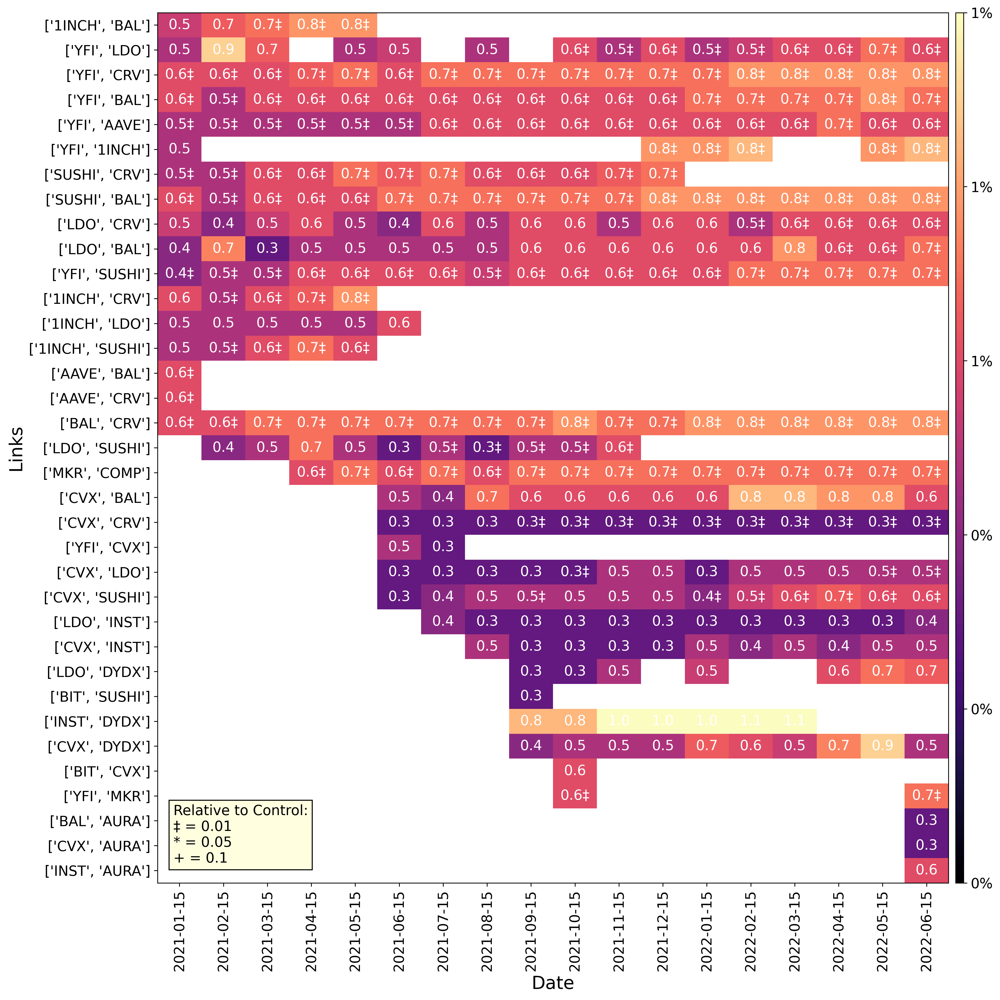

In [ ]:
plot_heatmap_chart(metric_dataframes, metric_name='median_number_assets', pct=False, log=True, output_path="../output/links/", save=True, show=True)


### Fig: Distribution of Labels

In [69]:
metric_dataframes['sample_directional']['total_mean_pct_supply_label_distribution']

Date,2021-01-15,2021-02-15,2021-03-15,2021-04-15,2021-05-15,2021-06-15,2021-07-15,2021-08-15,2021-09-15,2021-10-15,2021-11-15,2021-12-15,2022-01-15,2022-02-15,2022-03-15,2022-04-15,2022-05-15,2022-06-15
Link Name,,,,,,,,,,,,,,,,,,
"['1INCH', 'BAL']: 1INCH","{'EOA': 1.1650993783628763e-05, 'cex': 0.00088...","{'EOA': 1.902744350679701e-05, 'cex': 0.002492...","{'EOA': 7.156230054326766e-05, 'cex': 0.003759...","{'EOA': 2.8223001070997045e-05, 'cex': 0.00331...","{'EOA': 8.254605661537327e-05, 'cex': 0.003519...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"['1INCH', 'BAL']: BAL","{'EOA': 1.9905335213822314e-05, 'cex': 0.00129...","{'EOA': 0.0002231338129646748, 'cex': 0.001822...","{'EOA': 0.00025093508862941585, 'cex': 0.00240...","{'EOA': 7.168521773838688e-05, 'cex': 0.002180...","{'EOA': 0.0002330461305268104, 'cex': 0.002683...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"['1INCH', 'CRV']: 1INCH","{'cex': 0.0012604227444027844, 'fund': 1.71567...","{'EOA': 2.227205922216225e-05, 'cex': 0.002640...","{'EOA': 7.19816079340315e-05, 'cex': 0.0039667...","{'EOA': 4.949586650108406e-05, 'cex': 0.003554...","{'EOA': 0.00011392883033604865, 'cex': 0.00370...","{'EOA': 2.9630467504297044e-05, 'cex': 0.00328...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"['1INCH', 'CRV']: CRV","{'cex': 0.0055601186560713615, 'fund': 0.00012...","{'EOA': 4.223349893353561e-05, 'cex': 0.007414...","{'EOA': 5.968648321372814e-05, 'cex': 0.007817...","{'EOA': 0.00010726719833946195, 'cex': 0.00820...","{'EOA': 0.0003567184227330992, 'cex': 0.008042...","{'EOA': 5.7884980805736084e-05, 'cex': 0.00555...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"['1INCH', 'LDO']: 1INCH",{'EOA': 1.114012485006e-05},{'unknown_smart_contract': 3.2075630544638806e...,"{'EOA': 4.331398681203263e-06, 'unknown_smart_...","{'EOA': 3.0303030369332186e-06, 'unknown_smart...","{'EOA': 3.030303036933393e-06, 'cex': 1.013478...","{'EOA': 1.3503200542365785e-05, 'cex': 5.40433...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"['YFI', 'LDO']: YFI",{'unknown_smart_contract': 2.5167198686618266e...,{'unknown_smart_contract': 1.4321828075682456e...,"{'EOA': 2.753646879539e-05, 'unknown_smart_con...",NaN,"{'EOA': 9.040836792083658e-05, 'cex': 8.400277...","{'EOA': 8.301542642846923e-05, 'cex': 0.000193...",NaN,"{'EOA': 4.693744669576467e-05, 'cex': 0.000178...",NaN,"{'EOA': 8.057505148664999e-05, 'bridge': 1.305...","{'EOA': 6.692335392250714e-05, 'bridge': 1.305...","{'EOA': 7.707555777934284e-05, 'bridge': 1.305...","{'EOA': 7.707555777934284e-05, 'blockchain-sca...","{'EOA': 0.0001191203857362, 'blockchain-scalin...","{'EOA': 9.55197631279643e-05, 'blockchain-scal...","{'EOA': 0.00019212489584252143, 'blockchain-sc...","{'EOA': 0.00015779967924690948, 'blockchain-sc...","{'EOA': 0.00023226173923012754, 'blockchain-sc..."
"['YFI', 'MKR']: MKR",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"{'EOA': 0.0010227166919411698, 'cex': 0.003296...","{'EOA': 0.0005313321584779054, 'cex': 0.003857...","{'EOA': 0.0004638536054957629, 'cex': 0.004656...","{'EOA': 0.0005622698812692255, 'cex': 0.004438...",NaN,NaN,"{'EOA': 0.0004789063855200113, 'blockchain-sca...","{'EOA': 0.00048084978064510817, 'blockchain-sc...","{'EOA': 0.000490713040142226, 'blockchain-scal...","{'EOA': 0.0004851354805235032, 'blockchain-sca..."
"['YFI', 'MKR']: YFI",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"{'EOA': 0.001782224058124336, 'cex': 0.0097594...","{'EOA': 0.0010108267933348794, 'cex': 0.011600...","{'EOA': 0.0009158284842004079, 'cex': 0.011466...","{'EOA': 0.0011029710377440274, 'cex': 0.012412...",NaN,NaN,"{'EOA': 0.0008789323758150135, 'blockchain-sca...","{'EOA': 0.0008725575136216344, 'blockchain-sca...","{'EOA': 0.0009117664771152228, 'blockchain-sca...","{'EOA': 0.0009602292937952978, 'blockchain-sca..."


In [64]:
0.000039*100

0.0039

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:681: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{int(val)}%' for val in tick_vals])


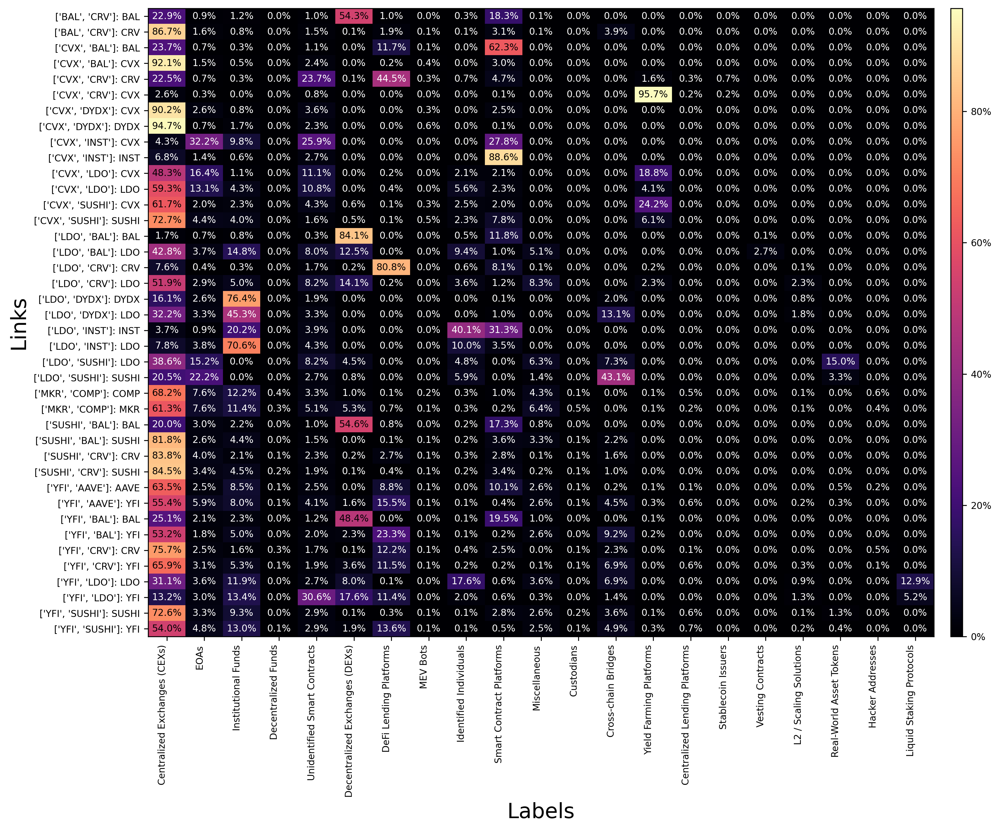

In [ ]:
plot_heatmap_labels(metric_dataframes, metric='total_mean_pct_supply_label_distribution', group='sample_directional', colormap='magma', output_path='../output/links', min_occurrences=9, custom_index=None)

### Fig: influence_directional

/home/xm3van/research-project-erc20-governance/notebooks/../src/visualisations/link_analysis_visualisations.py:406: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels([f'{round(val)}%' for val in tick_vals])


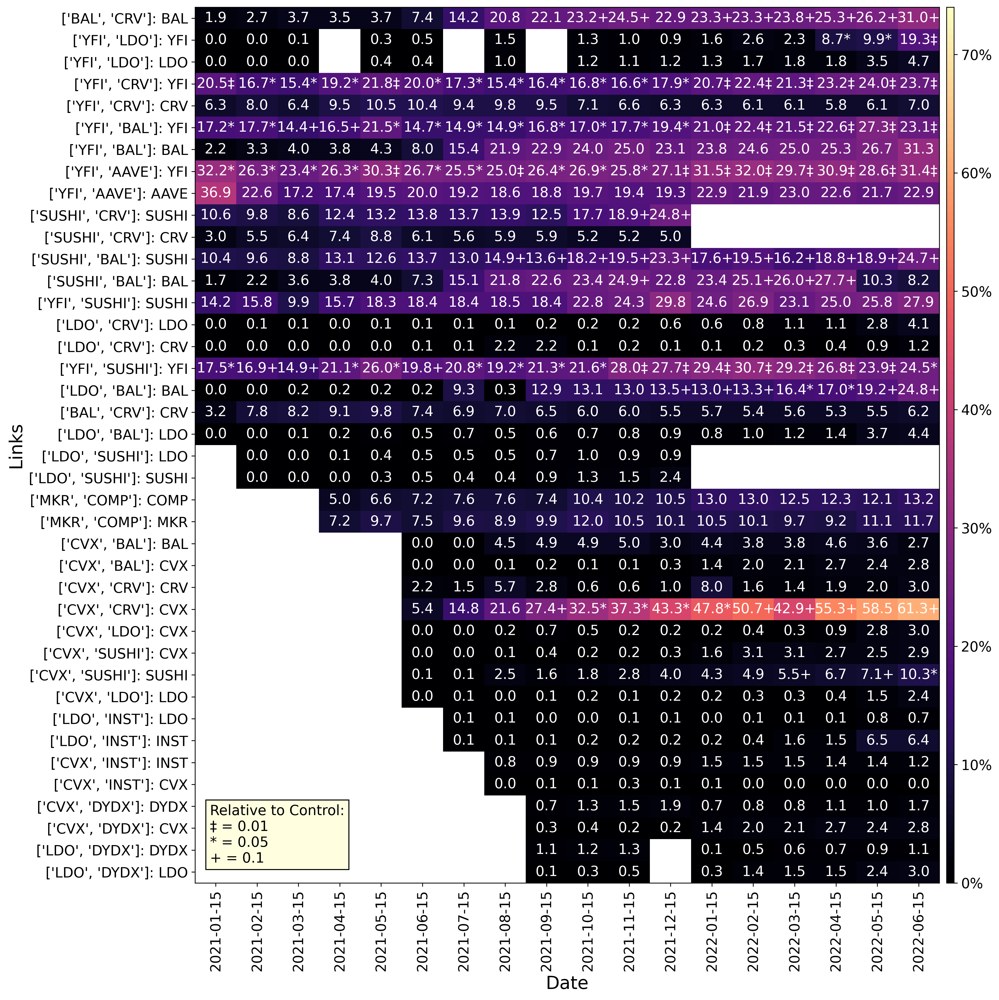

In [75]:
plot_heatmap_chart_directional(metric_dataframes, metric_name='total_influence_directional', pct=True, log=False, output_path="../output/links/directional_analysis", save=True, show=True, min_occurance=9)

### Sensitivity Analysis 

In [ ]:
# Example usage
file_paths = [
    "../output/links/metrics/links_data_0.005.pkl",
    "../output/links/metrics/links_data_0.05.pkl",
    "../output/links/metrics/links_data_5e-05.pkl",
    "../output/links/metrics/links_data_5e-06.pkl",
    "../output/links/metrics/links_data_5e-07.pkl",
    "../output/links/metrics/links_data_0.0005.pkl"
]

# List of metrics to plot
chosen_metrics = ['size', 
           'median_number_assets', 
        #    'total_influence', 
        #    'gini_total_influence', 
           'internal_influence', 
           'gini_internal_influence', 
        #    'external_influence', 
        #    'gini_external_influence',  
        #    'median_influence', 
           'median_wealth', 
        #    'total_wealth', 
        #    'gini_total_wealth', 
        #    'internal_wealth', 
        #    'gini_internal_wealth', 
        #    'external_wealth', 
        #    'gini_external_wealth'
           ]

sensitivity_analysis(file_paths, chosen_metrics,output_path='../output/links')
